In [2]:
import pandas as pd
import numpy as np
import data_preprocess as dp
import data_visualization as dv
import geopandas as gpd
from shapely.geometry import Point, LineString

### Read Data

In [3]:
data_path = 'data/yellow_tripdata_2022-01.parquet'
data = dp.getTripData(data_path,'2022/01/01','2022/02/01')
data.head()

,index,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,...,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,count
0,0,1,2022-01-01 00:35:40,2022-01-01 00:53:29,2.0,3.80,1.0,N,142,236,...,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0,1
1,1,1,2022-01-01 00:33:43,2022-01-01 00:42:07,1.0,2.10,1.0,N,236,42,...,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0,1
2,2,2,2022-01-01 00:53:21,2022-01-01 01:02:19,1.0,0.97,1.0,N,166,166,...,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0,1
3,3,2,2022-01-01 00:25:21,2022-01-01 00:35:23,1.0,1.09,1.0,N,114,68,...,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0,1
4,4,2,2022-01-01 00:36:48,2022-01-01 01:14:20,1.0,4.30,1.0,N,68,163,...,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0,1


In [5]:
data['DOLocationID'].value_counts()

236    123448
237    106348
141     78325
239     75036
161     74698
        ...  
187        12
204         9
2           5
105         2
99          1
Name: DOLocationID, Length: 261, dtype: int64

In [6]:
data['PULocationID'].value_counts()

237    121617
236    120806
132    103375
161     88223
186     80563
        ...  
105         1
172         1
176         1
27          1
187         1
Name: PULocationID, Length: 257, dtype: int64

In [7]:
gdf = gpd.read_file('./data/NYC Taxi Zones.geojson')

### Read the taxi_zones

In [21]:
zone_path = './data/taxi_zones.csv'
zones = pd.read_csv(zone_path)

In [22]:
zones = zones[['LocationID','zone','borough']]

In [23]:
zones.value_counts()

LocationID  zone                                           borough      
103         Governor's Island/Ellis Island/Liberty Island  Manhattan        3
56          Corona                                         Queens           2
1           Newark Airport                                 EWR              1
176         Oakwood                                        Staten Island    1
181         Park Slope                                     Brooklyn         1
                                                                           ..
94          Fordham South                                  Bronx            1
95          Forest Hills                                   Queens           1
96          Forest Park/Highland Park                      Queens           1
97          Fort Greene                                    Brooklyn         1
263         Yorkville West                                 Manhattan        1
Length: 260, dtype: int64

In [24]:
z = zones['LocationID'].map(lambda x:x==56)
zz = zones[z]
zz

,LocationID,zone,borough
55,56,Corona,Queens
56,56,Corona,Queens


In [11]:
zones_m = zones['borough'].map(lambda x: x == 'Manhattan' )
manhattan_zones = zones[zones_m]

In [12]:
manhattan_zones

,LocationID,zone,borough
3,4,Alphabet City,Manhattan
9,24,Bloomingdale,Manhattan
12,12,Battery Park,Manhattan
13,13,Battery Park City,Manhattan
40,41,Central Harlem,Manhattan
...,...,...,...
246,244,Washington Heights South,Manhattan
248,246,West Chelsea/Hudson Yards,Manhattan
251,249,West Village,Manhattan
261,261,World Trade Center,Manhattan


### Visualization

In [25]:
gdf = gpd.read_file('./data/NYC Taxi Zones.geojson') # the taxi zones
centroid = gdf.centroid # get the centroid
m_zones = gdf['borough'].apply(lambda x:x=='Manhattan')
zones = gdf['zone'][m_zones]
# get each OD pair's coordinate
# tripdata['PUPoint'] = tripdata['PULocationID'].apply(lambda x:centroid[x-1])
# tripdata['DOPoint'] = tripdata['DOLocationID'].apply(lambda x:centroid[x-1])
# start draw
ax = gdf.plot(figsize=(100, 100), alpha=0.5, edgecolor='k') # plot the region
    
# Create a new GeoDataFrame containing the centroids and names
centroid_gdf = gpd.GeoDataFrame({'name': zones, 'geometry': centroid}, crs=gdf.crs)
# Plot the centroid_gdf as a dot on the same plot, with names as labels
centroid_gdf.plot(ax=ax, color='red', markersize=50)
for idx, row in centroid_gdf.iterrows():
  ax.annotate(row['name'], xy=row['geometry'].coords[0], ha='center', va='center', color='black')

/var/folders/z3/8n55n4g55ml3g61cmdvlw2mh0000gn/T/ipykernel_47184/3765652296.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.centroid # get the centroid


In [14]:
zones

0                 Newark Airport
1                    Jamaica Bay
2        Allerton/Pelham Gardens
3                  Alphabet City
4                  Arden Heights
                 ...            
258    Williamsburg (South Side)
259           Woodlawn/Wakefield
260                     Woodside
261           World Trade Center
262               Yorkville East
Name: zone, Length: 263, dtype: object

In [27]:
poi_gdf = gpd.read_file('./data/Points Of Interest.geojson')
poi_gdf.head(20)

,name,source,complexid,saftype,pri_add,modified,faci_dom,facility_t,b7_sc,placeid,bin,sos,segmentid,borough,created,geometry
0,HOLLAND,DoITT,0,N,0.0,2011-11-18,9,6,19743001,567,0,1,31895,1,2009-05-14,POINT (-74.00702 40.72463)
1,WHITESTONE,DoITT,3378,N,0.0,2017-01-09,8,6,49731001,568,0,2,306303,4,2009-05-14,POINT (-73.82662 40.79718)
2,BROOKLYN,DoITT,3960,N,0.0,2018-01-22,8,6,39734001,576,0,2,144842,3,2009-05-14,POINT (-73.99395 40.70385)
3,MANHATTAN,DoITT,0,N,0.0,2011-05-11,8,6,19795001,580,0,1,162664,1,2009-05-14,POINT (-73.99194 40.70960)
4,PULASKI,DoITT,0,N,0.0,2017-03-03,8,6,39740001,582,0,1,157362,3,2009-05-14,POINT (-73.95266 40.73907)
5,RIKERS ISLAND,DoITT,0,N,0.0,2017-05-09,8,6,29823001,584,0,2,188216,2,2009-05-14,POINT (-73.88514 40.78673)
6,BORDEN AVENUE BRIDGE,DoITT,0,N,0.0,2017-05-09,8,6,43649002,590,0,2,189271,4,2009-05-14,POINT (-73.94270 40.73904)
7,3,DoITT,0,N,0.0,2017-03-03,8,6,30538002,594,0,2,22514,3,2009-05-14,POINT (-73.99022 40.67615)
8,145,DoITT,0,N,0.0,2015-10-21,8,6,29830001,603,0,1,69404,2,2009-05-14,POINT (-73.93236 40.81951)
9,MANHATTAN,DoITT,3960,N,0.0,2018-01-22,8,6,39721001,605,0,2,155168,3,2009-05-14,POINT (-73.98924 40.70487)


#### The Trip Data

#### One day

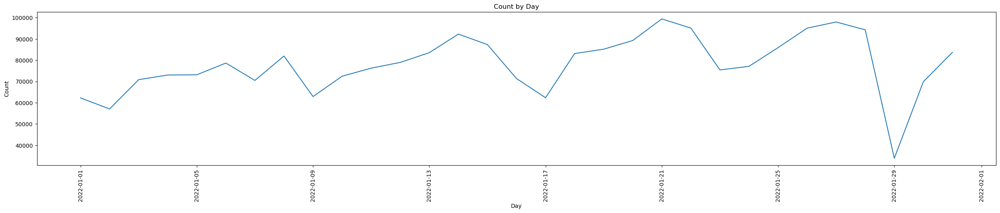

In [2]:

data_path = 'data/yellow_tripdata_2022-01.parquet'
daydata = dp.getTripData(data_path)
daydata=daydata.set_index('tpep_pickup_datetime')
daydata = pd.DataFrame(daydata['count'].resample('D').count())
dv.bar_plot(daydata, 'Day', (31,5))


#### Half Day

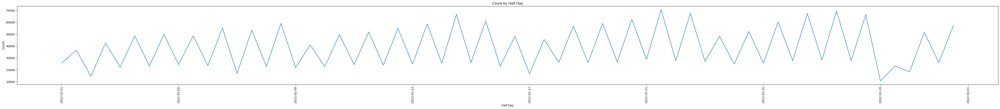

In [3]:
data_path = 'data/yellow_tripdata_2022-01.parquet'
halfdaydata = dp.getTripData(data_path)
halfdaydata=halfdaydata.set_index('tpep_pickup_datetime')
halfdaydata = pd.DataFrame(halfdaydata['count'].resample('12H').count())
dv.bar_plot(halfdaydata, 'Half Day', (62, 5))

#### One hour

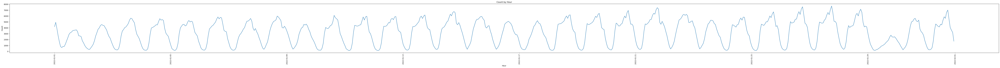

In [4]:
data_path = 'data/yellow_tripdata_2022-01.parquet'
hourdata = dp.getTripData(data_path)
hourdata=hourdata.set_index('tpep_pickup_datetime')
hourdata = pd.DataFrame(hourdata['count'].resample('H').count())
dv.bar_plot(hourdata, 'Hour', (100,5))

#### One day's hour

In [5]:
tripdata = pd.read_parquet("data/yellow_tripdata_2022-01.parquet") # read parquet data
# filter the invalid data
PULocationID_requried = tripdata['PULocationID'].map(lambda x : x<264)
DOLocationID_requried = tripdata['DOLocationID'].map(lambda x : x<264)
tripdata = tripdata[PULocationID_requried & DOLocationID_requried]
start_time = pd.to_datetime('2022/01/02')
end_time = pd.to_datetime('2022/01/03')
tripdata = dp.getDataByTime(tripdata, start_time, end_time)
tripdata['count']=1
tripdata=tripdata.set_index('tpep_pickup_datetime')

In [6]:
hourdata = pd.DataFrame(tripdata['count'].resample('H').count())
hourdata

,count
tpep_pickup_datetime,
2022-01-02 00:00:00,1436
2022-01-02 01:00:00,994
2022-01-02 02:00:00,687
2022-01-02 03:00:00,487
2022-01-02 04:00:00,352
2022-01-02 05:00:00,330
2022-01-02 06:00:00,591
2022-01-02 07:00:00,875
2022-01-02 08:00:00,1208


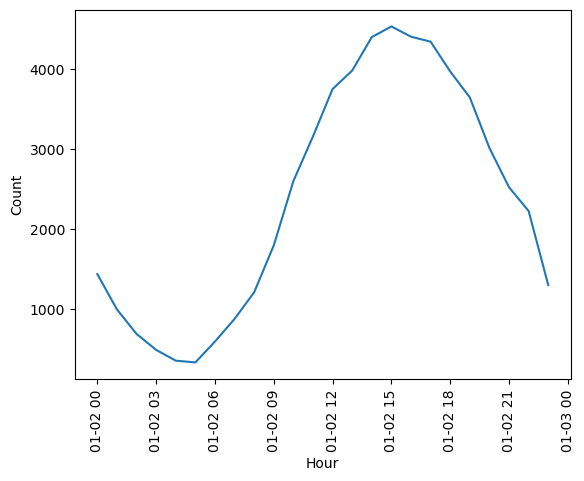

In [7]:
import matplotlib.pyplot as plt

plt.plot(hourdata.index, hourdata['count'])
plt.xticks(rotation=90)
plt.xlabel('Hour')
plt.ylabel('Count')
plt.show()

#### most frequent OD pairs

In [8]:
data_path = './data/yellow_tripdata_2022-01.parquet'
tripdata = dp.getTripData(data_path)
start_time1 = pd.to_datetime('2022/01/01')
end_time1 = pd.to_datetime('2022/01/02')
day1 = dp.getDataByTime(tripdata, start_time1, end_time1)
start_time2 = pd.to_datetime('2022/01/18')
end_time2 = pd.to_datetime('2022/01/19')
day2 = dp.getDataByTime(tripdata, start_time2, end_time2)
start_time3 = pd.to_datetime('2022/01/23')
end_time3 = pd.to_datetime('2022/01/24')
day3 = dp.getDataByTime(tripdata, start_time3, end_time3)


In [9]:
day1_pair_counts = day1[['PULocationID','DOLocationID']].value_counts().reset_index(name='count')
day2_pair_counts = day2[['PULocationID','DOLocationID']].value_counts().reset_index(name='count')
day3_pair_counts = day3[['PULocationID','DOLocationID']].value_counts().reset_index(name='count')

In [10]:
day1_most_frequent = day1_pair_counts.sort_values('count', ascending=False).head(100)
day1_least_frequent = day1_pair_counts.sort_values('count').head(100)
day2_most_frequent = day2_pair_counts.sort_values('count', ascending=False).head(100)
day2_least_frequent = day2_pair_counts.sort_values('count').head(100)
day3_most_frequent = day3_pair_counts.sort_values('count', ascending=False).head(100)
day3_least_frequent = day3_pair_counts.sort_values('count').head(100)

In [11]:
day1_most_frequent

,PULocationID,DOLocationID,count
0,48,48,195
1,142,239,178
2,239,142,174
3,48,68,173
4,263,141,168
...,...,...,...
92,237,262,71
93,140,263,71
94,236,238,71
98,142,236,70


/Users/roderick/Library/Mobile Documents/com~apple~CloudDocs/Dissertation/Code/data_visualization.py:51: FutureWarning: Interpreting call
	'.reindex(a, b)' as 
	'.reindex(index=a, columns=b)'.
Use named arguments to remove any ambiguity. In the future, using positional arguments for 'index' or 'columns' will raise a 'TypeError'.
  heatmap_df = heatmap_df.reindex(range(1, 264), range(1, 264), fill_value=0)


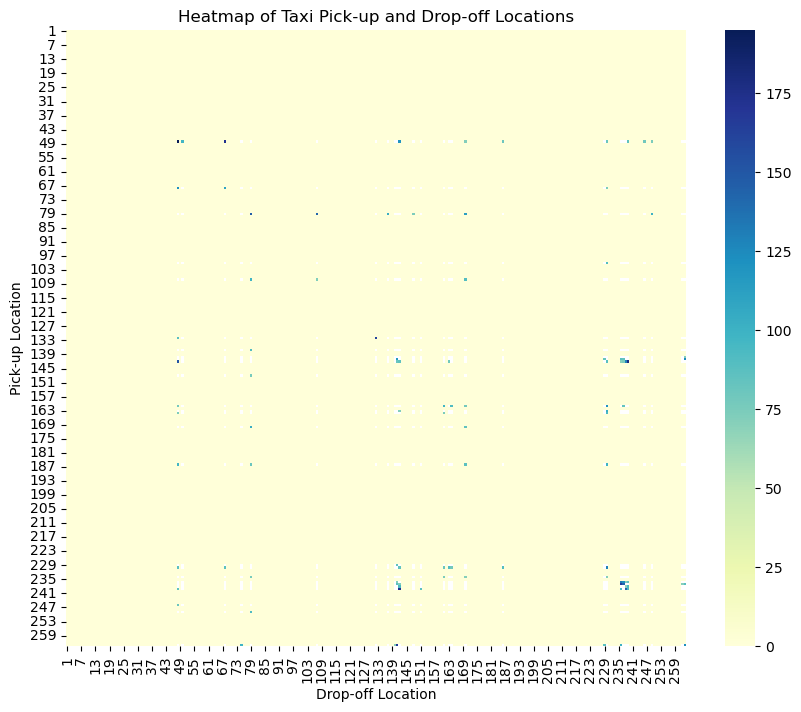

In [12]:
dv.data_heatmap(day1_most_frequent)

In [13]:
day2_most_frequent

,PULocationID,DOLocationID,count
0,237,236,771
1,236,237,735
2,236,236,561
3,237,237,475
4,141,236,311
...,...,...,...
95,170,161,121
96,170,107,119
97,140,229,119
98,161,142,119


/Users/roderick/Library/Mobile Documents/com~apple~CloudDocs/Dissertation/Code/data_visualization.py:51: FutureWarning: Interpreting call
	'.reindex(a, b)' as 
	'.reindex(index=a, columns=b)'.
Use named arguments to remove any ambiguity. In the future, using positional arguments for 'index' or 'columns' will raise a 'TypeError'.
  heatmap_df = heatmap_df.reindex(range(1, 264), range(1, 264), fill_value=0)


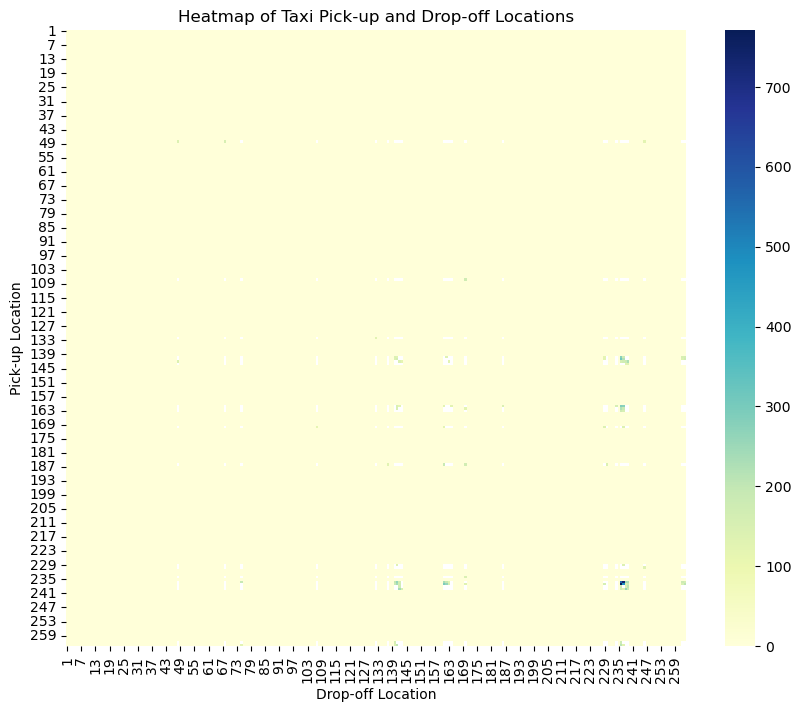

In [14]:
dv.data_heatmap(day2_most_frequent)

In [15]:
day3_most_frequent

,PULocationID,DOLocationID,count
0,237,236,412
1,236,237,327
2,236,236,290
3,237,237,283
4,263,141,260
...,...,...,...
94,170,141,91
96,143,238,90
98,237,140,90
97,68,249,90


/Users/roderick/Library/Mobile Documents/com~apple~CloudDocs/Dissertation/Code/data_visualization.py:51: FutureWarning: Interpreting call
	'.reindex(a, b)' as 
	'.reindex(index=a, columns=b)'.
Use named arguments to remove any ambiguity. In the future, using positional arguments for 'index' or 'columns' will raise a 'TypeError'.
  heatmap_df = heatmap_df.reindex(range(1, 264), range(1, 264), fill_value=0)


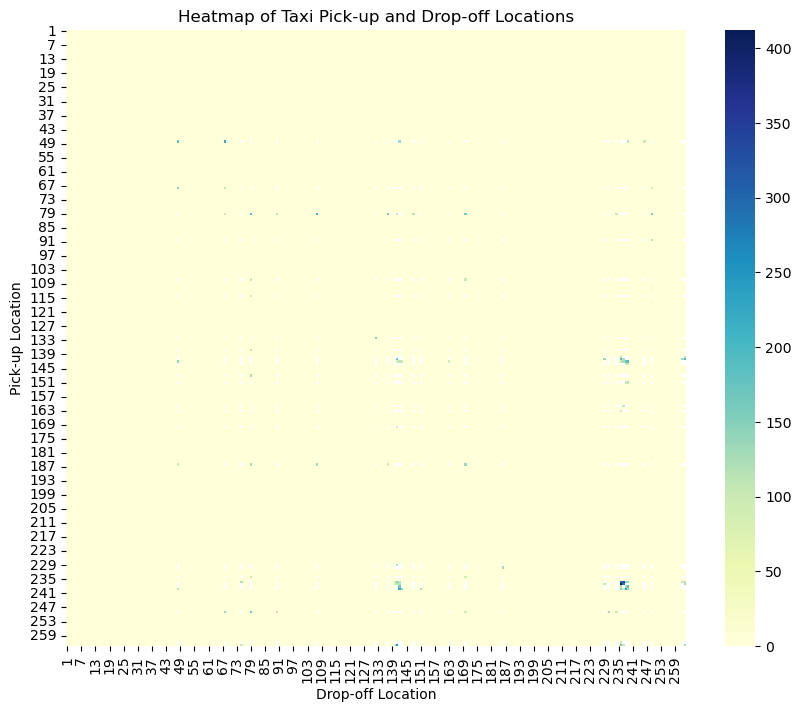

In [16]:
dv.data_heatmap(day3_most_frequent)

#### how many self-travel pairs

In [50]:
data_path = './data/yellow_tripdata_2022-01.parquet'
tripdata = dp.getTripData(data_path)



In [51]:
self_travel= tripdata[tripdata['PULocationID']==tripdata['DOLocationID']]

In [52]:
len(self_travel)/len(tripdata)

0.05110821532882765

In [53]:
self_travel = self_travel[['PULocationID','DOLocationID']].value_counts().reset_index(name='self_count').sort_values('self_count',ascending=False).head(20)

In [54]:
self_travel

,PULocationID,DOLocationID,self_count
0,236,236,13869
1,237,237,12149
2,141,141,5274
3,48,48,4976
4,239,239,4957
5,132,132,4586
6,238,238,3950
7,142,142,3934
8,79,79,3736
9,263,263,3551


In [17]:
from shapely.geometry import Point
import geopandas as gpd
def point_vis(point_data):
    gdf = gpd.read_file('./data/NYC Taxi Zones.geojson') # the taxi zones
    centroid = gdf.centroid # get the centroid
    zones = gdf['zone'] 
    # get each OD pair's coordinate
    point_data['PUPoint'] = point_data['PULocationID'].apply(lambda x:centroid[x-1])
    point_data['DOPoint'] = point_data['DOLocationID'].apply(lambda x:centroid[x-1])
    # start draw
    ax = gdf.plot(figsize=(100, 100), alpha=0.5, edgecolor='k') # plot the region
    
    # Create a new GeoDataFrame containing the centroids and names
    centroid_gdf = gpd.GeoDataFrame({'name': zones, 'geometry': centroid}, crs=gdf.crs)
    # Plot the centroid_gdf as a dot on the same plot, with names as labels
    centroid_gdf.plot(ax=ax, color='yellow', markersize=50)
    for idx, row in centroid_gdf.iterrows():
        ax.annotate(row['name'], xy=row['geometry'].coords[0], ha='center', va='center', color='black')
           
    # Create a new GeoDataFrame containing the points and names
    # points = [Point(p) for p in tripdata['PUPoint'].values]
    point_gdf = gpd.GeoDataFrame({'name': zones, 'geometry': point_data['PUPoint']}, crs=gdf.crs)
    # Plot the centroid_gdf as a dot on the same plot, with names as labels
    point_gdf.plot(ax=ax, color='red', markersize=400)
    
    # Show the plot
    plt.show()

In [18]:
point_vis(self_travel)

NameError: name 'self_travel' is not defined

In [57]:
frequent_O= tripdata['PULocationID'].value_counts().reset_index(name='O_count').sort_values('O_count',ascending=False).head(20)

In [65]:
def f_o_point_vis(point_data):
    gdf = gpd.read_file('./data/NYC Taxi Zones.geojson') # the taxi zones
    centroid = gdf.centroid # get the centroid
    zones = gdf['zone'] 
    # get each OD pair's coordinate
    point_data['PUPoint'] = point_data['index'].apply(lambda x:centroid[x-1])
    # point_data['DOPoint'] = point_data['DOLocationID'].apply(lambda x:centroid[x-1])
    # start draw
    ax = gdf.plot(figsize=(100, 100), alpha=0.5, edgecolor='k') # plot the region
    
    # Create a new GeoDataFrame containing the centroids and names
    centroid_gdf = gpd.GeoDataFrame({'name': zones, 'geometry': centroid}, crs=gdf.crs)
    # Plot the centroid_gdf as a dot on the same plot, with names as labels
    centroid_gdf.plot(ax=ax, color='yellow', markersize=50)
    for idx, row in centroid_gdf.iterrows():
        ax.annotate(row['name'], xy=row['geometry'].coords[0], ha='center', va='center', color='black')
           
    # Create a new GeoDataFrame containing the points and names
    # points = [Point(p) for p in tripdata['PUPoint'].values]
    point_gdf = gpd.GeoDataFrame({'name': zones, 'geometry': point_data['PUPoint']}, crs=gdf.crs)
    # Plot the centroid_gdf as a dot on the same plot, with names as labels
    point_gdf.plot(ax=ax, color='red', markersize=400)
    
    # Show the plot
    plt.show()

In [66]:
f_o_point_vis(frequent_O)

/var/folders/z3/8n55n4g55ml3g61cmdvlw2mh0000gn/T/ipykernel_53847/3546563201.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.centroid # get the centroid


In [58]:
frequent_O

,index,O_count
0,237,121286
1,236,120470
2,132,99400
3,161,87907
4,186,80174
5,142,79960
6,141,76988
7,48,76569
8,239,75314
9,170,75188


In [61]:
frequent_D= tripdata['DOLocationID'].value_counts().reset_index(name='O_count').sort_values('O_count',ascending=False).head(20)

In [63]:
def f_d_point_vis(point_data):
    gdf = gpd.read_file('./data/NYC Taxi Zones.geojson') # the taxi zones
    centroid = gdf.centroid # get the centroid
    zones = gdf['zone'] 
    # get each OD pair's coordinate
    point_data['PUPoint'] = point_data['index'].apply(lambda x:centroid[x-1])
    # point_data['DOPoint'] = point_data['DOLocationID'].apply(lambda x:centroid[x-1])
    # start draw
    ax = gdf.plot(figsize=(100, 100), alpha=0.5, edgecolor='k') # plot the region
    
    # Create a new GeoDataFrame containing the centroids and names
    centroid_gdf = gpd.GeoDataFrame({'name': zones, 'geometry': centroid}, crs=gdf.crs)
    # Plot the centroid_gdf as a dot on the same plot, with names as labels
    centroid_gdf.plot(ax=ax, color='yellow', markersize=50)
    for idx, row in centroid_gdf.iterrows():
        ax.annotate(row['name'], xy=row['geometry'].coords[0], ha='center', va='center', color='black')
           
    # Create a new GeoDataFrame containing the points and names
    # points = [Point(p) for p in tripdata['PUPoint'].values]
    point_gdf = gpd.GeoDataFrame({'name': zones, 'geometry': point_data['PUPoint']}, crs=gdf.crs)
    # Plot the centroid_gdf as a dot on the same plot, with names as labels
    point_gdf.plot(ax=ax, color='red', markersize=400)
    
    # Show the plot
    plt.show()

In [ ]:
f_d_point_vis(frequent_D)

In [62]:
frequent_D

,index,O_count
0,236,123019
1,237,105982
2,141,78014
3,239,74744
4,161,74377
5,170,73332
6,142,70159
7,48,67936
8,238,65210
9,263,60795
